In [6]:
# Load libraries
import os
#os.environ["USE_PYGEOS"] =0
import numpy as np
import pandas as pd
#pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from pylab import rcParams
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 72

import seaborn as sns
sns.set_style("darkgrid")
sns.set_context(context="paper", font_scale=1.5, rc=None)
sns.set(font="serif")
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder
#import plotly.express as px
#import plotly.graph_objects as go

import geopandas as gpd

import warnings
#warnings.filterwarnings('ignore') 
import time

# IMPORT DATA

In [8]:
import pandas as pd

In [5]:
def read_csv(run:int, object:str):
    return pd.read_csv(f"data/trees/{str(run)}{object}.csv").drop(columns=["Unnamed: 0"])

    

In [17]:
placeholder = 1
placeholder2 = ""
residualsClass = ""
evaluationClass = ""
predictionClass = ""
importanceClass = ""

In [6]:
class residualsClass:
    def __init__(self, run):
        self.values = read_csv(run, "residuals_values").rename(columns={"x":"values"})
        self.values_median = read_csv(run, "residuals_values_median")
        self.values_repetitions = read_csv(run, "residuals_values_repetitions")

class evaluationClass:
    def __init__(self, run):
        self.PLACEHOLDER = 0

class predictionClass:
    def __init__(self, run):
        self.values = read_csv(run, "predictions_values").rename(columns={"x":"values"})
        self.values_per_repetion = read_csv(run, "prediction_values_per_repetition")
        self.values_median = read_csv(run, "prediction_values_median")

class importanceClass:
    def __init__(self, run):
        self.per_variable = read_csv(run, "importance_per_variable")
        self.per_repetition = read_csv(run, "importance_per_repetition")
        self.local = read_csv(run, "importance_local")



In [11]:
class treeRepeat:
    def __init__(self, run):
        
        self.num_trees = read_csv(run, "num_trees").iloc[0,0]
        self.num_independent_variables = read_csv(run, "num_independent_variables").iloc[0,0]
        self.mtry = read_csv(run, "mtry").iloc[0,0]
        self.min_node_size = read_csv(run, "min_node_size").iloc[0,0]
        self.variable_importance = read_csv(run, "variable_importance")
        self.variable_importance_local = read_csv(run, "variable_importance_local")
        self.prediction_error = read_csv(run, "prediction_error").iloc[0,0]
        self.r_squared = read_csv(run, "r_squared").iloc[0,0]
        self.num_samples = read_csv(run, "num_samples").iloc[0,0]
        self.performance = read_csv(run, "performance")
        self.residuals = residualsClass(run)
        self.evaluation = evaluationClass(run)
        self.predictions = predictionClass(run)
        self.importance = importanceClass(run)

test = treeRepeat(run=1)
print(test.importance.local) 



          bedrooms     bathrooms  half_bathrooms      lot_size  \
0    958031.174513 -1.558691e+06    1.069468e+06  1.850563e+06   
1     46809.609869  1.069942e+06    4.257449e+05  1.785766e+06   
2    283376.584404 -9.660616e+05   -3.804422e+05 -4.970875e+05   
3    587887.301980  2.391721e+05   -3.864219e+05  9.575203e+05   
4    266357.128971  9.699940e+05    9.229704e+05  1.222366e+06   
..             ...           ...             ...           ...   
696  485310.134803 -1.323366e+06   -9.578896e+05 -1.882883e+06   
697  476512.423557  9.055903e+05    8.149203e+05  1.425078e+06   
698  686158.873737  4.859771e+05    4.998522e+05  1.424574e+06   
699  317520.772216  7.173026e+05    3.442591e+05  8.419447e+05   
700  296889.367377  4.514992e+05    3.633455e+05 -1.496164e+04   

     construction_size  property_type_id_id       real_age          parks  \
0        -2.640157e+06        -80429.886124 -121778.679550 -278097.858477   
1         1.710901e+06        312036.347110 -100894.2

In [ ]:
# Load  dataset 
gdf  = gpd.read_file('data/nb_df.gpkg')

#Filtering bools
bools= gdf.select_dtypes(include=['bool'])

enc = OrdinalEncoder()
bools_encoded = enc.fit_transform(bools)
bools_encoded = pd.DataFrame(bools_encoded, columns = bools.columns)

#removing old bools
gdf = gdf.drop(bools.columns, axis = 1)
gdf = gdf.reset_index(drop = True)

#Adding encoded bools
gpd.GeoDataFrame(pd.concat([gdf, bools_encoded], axis = 1))

,bedrooms,bathrooms,half_bathrooms,lot_size,construction_size,age,property_type_id_id,real_age,latitude,longitude,...,mall,stadium,historic,museum,airport,industry,subway,bus,id_right,geometry
0,0.476190,0.625000,0.000000,0.003763,0.011252,0.050404,0.666667,0.63750,0.734095,0.374967,...,0.109214,0.289244,0.201548,0.239677,0.431379,0.137852,0.110229,0.142090,8,"MULTIPOLYGON (((2793299.849 832180.730, 279330..."
1,0.190476,0.000000,0.000000,0.000922,0.000922,0.016307,0.000000,0.20625,0.681015,0.400389,...,0.052868,0.291834,0.165431,0.171529,0.375544,0.034528,0.030134,0.089719,16,"MULTIPOLYGON (((2794357.004 830240.705, 279438..."
2,0.095238,0.000000,0.000000,0.001806,0.001806,0.000988,0.000000,0.01250,0.620292,0.355357,...,0.122658,0.344813,0.069537,0.093786,0.428161,0.231843,0.066746,0.255308,33,"MULTIPOLYGON (((2792835.890 828193.326, 279284..."
3,0.952381,0.375000,0.000000,0.004478,0.013811,0.000988,0.666667,0.01250,0.592558,0.580360,...,0.088197,0.214018,0.146534,0.205203,0.128221,0.048581,0.047996,0.154144,34,"MULTIPOLYGON (((2801132.447 826978.129, 280115..."
4,0.285714,0.125000,0.000000,0.003801,0.003425,0.024708,0.666667,0.31250,0.684659,0.366577,...,0.068524,0.374855,0.135974,0.080503,0.421840,0.101923,0.044454,0.113185,35,"MULTIPOLYGON (((2793254.156 830422.310, 279325..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
696,0.285714,0.225000,0.200000,0.019629,0.012148,0.014232,0.666667,0.18000,0.129991,0.473221,...,0.376595,0.101003,0.352250,0.452962,0.756389,0.493776,0.396604,0.122706,1559,"MULTIPOLYGON (((2796977.276 808648.302, 279697..."
697,0.285714,0.250000,0.166667,0.005400,0.007433,0.004942,0.666667,0.06250,0.323346,0.561194,...,0.056081,0.166610,0.113374,0.163247,0.453936,0.078084,0.056972,0.157170,1561,"MULTIPOLYGON (((2800395.769 816279.216, 280039..."
698,0.380952,0.250000,0.166667,0.006510,0.010274,0.026684,0.666667,0.33750,0.315105,0.574835,...,0.037904,0.186285,0.043021,0.229552,0.459112,0.120370,0.095834,0.114349,1562,"MULTIPOLYGON (((2800691.441 815947.949, 280075..."
699,0.285714,0.312500,0.166667,0.005005,0.007357,0.033108,0.666667,0.41875,0.225160,0.412928,...,0.065053,0.281912,0.181989,0.185858,0.676058,0.341799,0.287095,0.430071,1563,"MULTIPOLYGON (((2794204.043 812033.062, 279422..."


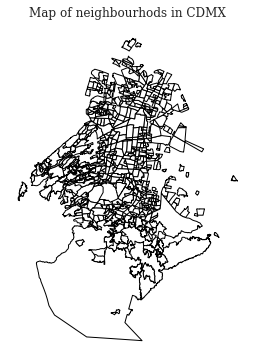

In [3]:
fig, ax = plt.subplots(figsize=(6, 6))
gdf.plot(color = 'white', edgecolor = 'black', ax = ax)
#gdf.centroid.plot(ax = ax)
ax.set_title('Map of neighbourhods in CDMX', fontsize=12)
ax.axis("off")
plt.show()


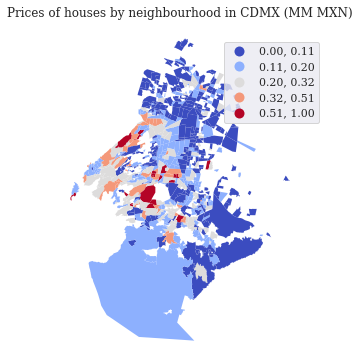

In [4]:
fig, ax = plt.subplots(figsize=(6, 6))
gdf.plot(column='price_small', cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax)
ax.set_title('Prices of houses by neighbourhood in CDMX (MM MXN)', fontsize=12)
ax.axis("off")
plt.show()

# Load the R data

In [36]:
tree_Importance = pd.read_csv("data/localImportance.csv").drop(columns=['Unnamed: 0'])
tree_prediction = pd.read_csv("data/predictions_per_repetition.csv").drop(columns=["Unnamed: 0"])

def getMean(x):
    return np.mean(x)

def getStd(x):
    return np.std(x)

reps = tree_prediction.columns.to_list()
tree_prediction["mean"] = tree_prediction[reps].apply(lambda x: getMean(x), axis=1)
tree_prediction["std"] = tree_prediction[reps].apply(lambda x: getStd(x), axis=1)
tree_prediction

gdf['price_mean'] = tree_prediction["mean"]
gdf['price_std'] = tree_prediction["std"]

In [52]:
def pTest(val, mean, std, sigma=2):
    return (val - mean)/1000000
    #return np.abs((val - mean)/std) > sigma

In [53]:
gdf["p-test"] = gdf[["price", "price_mean", "price_std"]].apply(lambda x: pTest(x[0], x[1],x[2]), axis=1)

<AxesSubplot: >

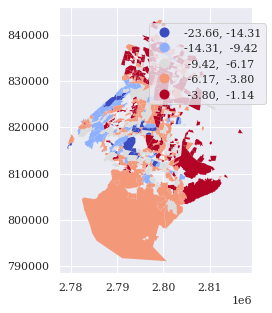

In [58]:
gdf.plot(column=("p-test"), cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)})


# Fit GWR model

In [19]:
for column in tree_Importance.columns:
    gdf[f"rf_{column}"] = tree_Importance[column]
gdf["rf_bedrooms"]

0      1.143461e+06
1      3.392426e+05
2     -3.342467e+05
3      1.045514e+06
4      4.784058e+05
           ...     
696    9.683670e+05
697    7.341425e+05
698    7.122729e+05
699    5.526499e+05
700    2.796822e+05
Name: rf_bedrooms, Length: 701, dtype: float64

In [15]:
# TODO change to sf_result
# Add R2 to GeoDataframe 
# gdf['gwr_R2'] = gwr_results.localR2

In [16]:
# TODO change to RF
# fig, ax = plt.subplots(figsize=(6, 6))
# gdf.plot(column='gwr_R2', cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax)
# ax.set_title('Local R2', fontsize=12)
# ax.axis("off")
# gdf.explore()
# plt.show()

# Plot coefficients

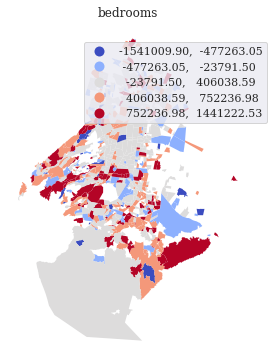

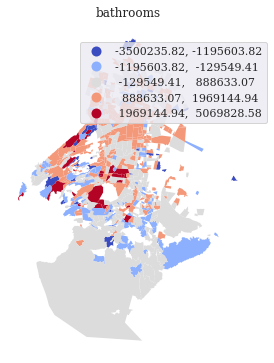

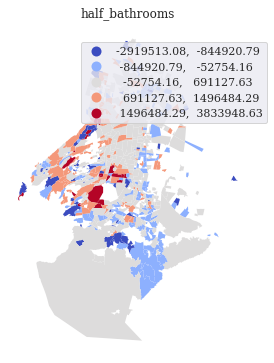

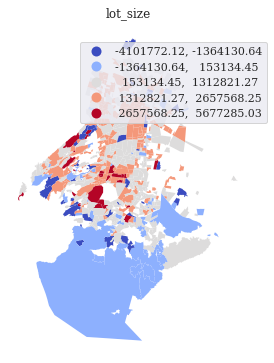

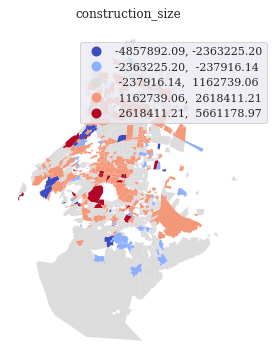

...

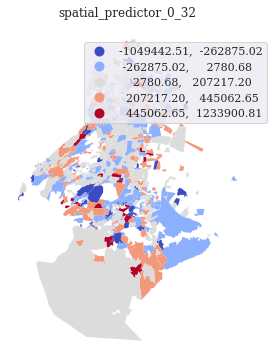

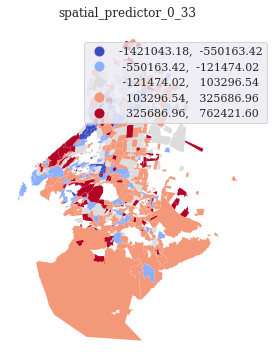

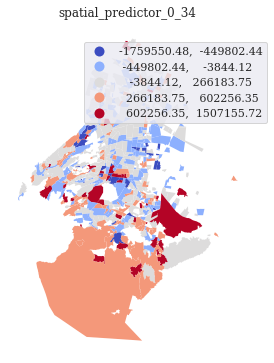

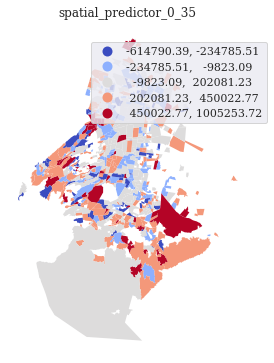

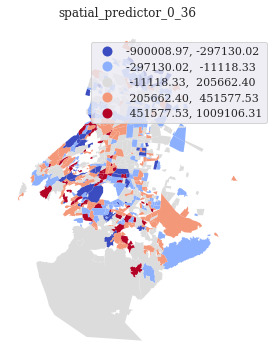

In [20]:
coef_names = tree_Importance.columns
for i in coef_names:
    fig, ax = plt.subplots(figsize=(6, 6))
    gdf.plot(column=("rf_" + i), cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=ax)
    ax.set_title(i, fontsize=12)
    ax.axis("off")
    #plt.savefig('myMap.png',dpi=150, bbox_inches='tight')
    plt.show()

In [17]:
# Filter t-values: standard alpha = 0.05
gwr_filtered_t = gwr_results.filter_tvals(alpha = 0.05)

In [18]:
pd.DataFrame(gwr_filtered_t)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
0,0.000000,0.000000,5.328285,7.622939,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.649516,0.0,0.000000,2.992906,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,-3.728239,3.400287,4.351372,0.000000,0.0
1,0.000000,0.000000,5.606729,8.435574,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.558723,0.0,0.000000,3.107628,0.0,0.0,0.000000,0.000000,0.0,0.000000,-2.052324,-3.484816,3.418217,4.474380,0.000000,0.0
2,0.000000,0.000000,6.702092,9.556943,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.335046,0.0,0.000000,3.993033,0.0,0.0,0.000000,-2.570763,0.0,0.000000,0.000000,-2.672517,2.953712,5.181020,-2.507022,0.0
3,2.412698,0.000000,7.371043,7.450758,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,-2.576611,2.236793,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,-3.174046,0.000000,3.116796,0.000000,0.0
4,0.000000,0.000000,5.861772,8.737942,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.568656,0.0,0.000000,3.443868,0.0,0.0,0.000000,0.000000,0.0,0.000000,-1.975194,-3.415625,3.381077,4.721547,-2.003861,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
696,4.741526,-2.462100,9.030539,7.824386,0.000000,2.653355,0.0,0.0,2.915767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-3.217373,0.0,-2.990159,0.000000,0.0,0.0,-5.541320,0.000000,0.0,-2.630859,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
697,3.373668,0.000000,8.095958,8.008405,2.367840,2.395420,0.0,0.0,2.743440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.464499,0.0,0.000000,0.000000,0.0,0.0,-5.009129,-1.981224,0.0,-3.971985,0.000000,-3.431741,0.000000,0.000000,0.000000,0.0
698,3.278947,0.000000,8.007473,7.873563,2.413330,2.303230,0.0,0.0,2.809870,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,-2.505697,0.0,0.000000,0.000000,0.0,0.0,-4.829815,0.000000,0.0,-3.924800,0.000000,-3.334254,0.000000,0.000000,0.000000,0.0
699,5.590563,-2.985674,10.388204,8.804667,2.121115,2.945338,0.0,0.0,2.502893,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.054680,0.0,0.0,-2.900099,0.0,-2.669723,0.000000,0.0,0.0,-6.580160,0.000000,0.0,-2.935552,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [19]:
# Filter t-values: corrected alpha due to multiple testing
gwr_filtered_tc = gwr_results.filter_tvals()

In [20]:
pd.DataFrame(gwr_filtered_tc)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
0,0.000000,0.000000,5.328285,7.622939,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.649516,0.0,0.000000,2.992906,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.728239,3.400287,4.351372,0.000000,0.0
1,0.000000,0.000000,5.606729,8.435574,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.558723,0.0,0.000000,3.107628,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.484816,3.418217,4.474380,0.000000,0.0
2,0.000000,0.000000,6.702092,9.556943,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,3.993033,0.0,0.0,0.000000,-2.570763,0.0,0.000000,0.0,-2.672517,2.953712,5.181020,-2.507022,0.0
3,2.412698,0.000000,7.371043,7.450758,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,-2.576611,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.174046,0.000000,3.116796,0.000000,0.0
4,0.000000,0.000000,5.861772,8.737942,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.568656,0.0,0.000000,3.443868,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,-3.415625,3.381077,4.721547,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
696,4.741526,-2.462100,9.030539,7.824386,0.00000,2.653355,0.0,0.0,2.915767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-3.217373,0.0,-2.990159,0.000000,0.0,0.0,-5.541320,0.000000,0.0,-2.630859,0.0,0.000000,0.000000,0.000000,0.000000,0.0
697,3.373668,0.000000,8.095958,8.008405,0.00000,2.395420,0.0,0.0,2.743440,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.464499,0.0,0.000000,0.000000,0.0,0.0,-5.009129,0.000000,0.0,-3.971985,0.0,-3.431741,0.000000,0.000000,0.000000,0.0
698,3.278947,0.000000,8.007473,7.873563,2.41333,0.000000,0.0,0.0,2.809870,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.505697,0.0,0.000000,0.000000,0.0,0.0,-4.829815,0.000000,0.0,-3.924800,0.0,-3.334254,0.000000,0.000000,0.000000,0.0
699,5.590563,-2.985674,10.388204,8.804667,0.00000,2.945338,0.0,0.0,2.502893,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-2.900099,0.0,-2.669723,0.000000,0.0,0.0,-6.580160,0.000000,0.0,-2.935552,0.0,0.000000,0.000000,0.000000,0.000000,0.0


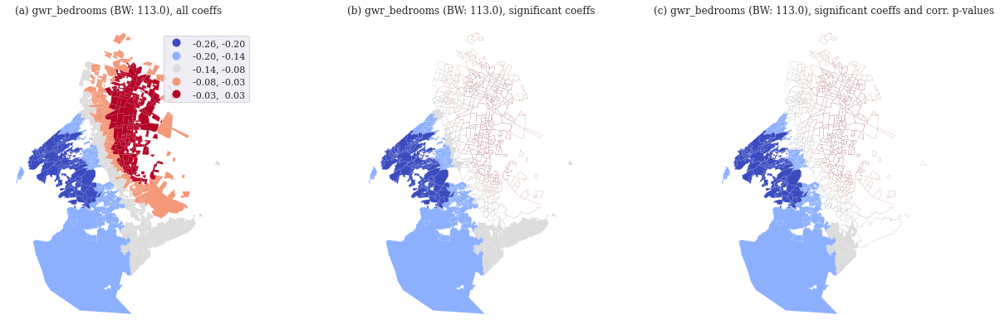

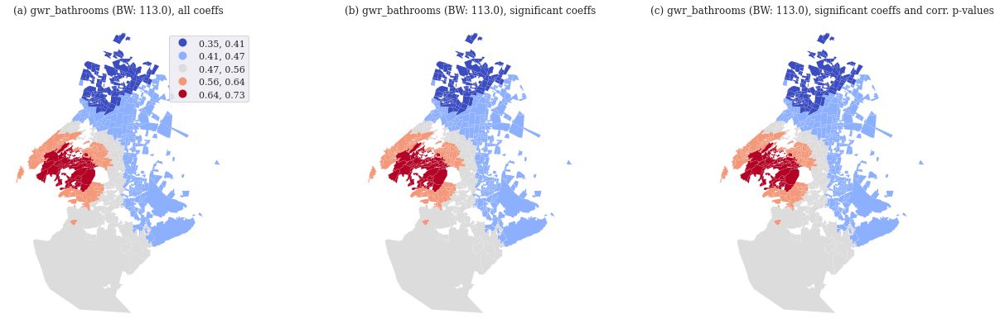

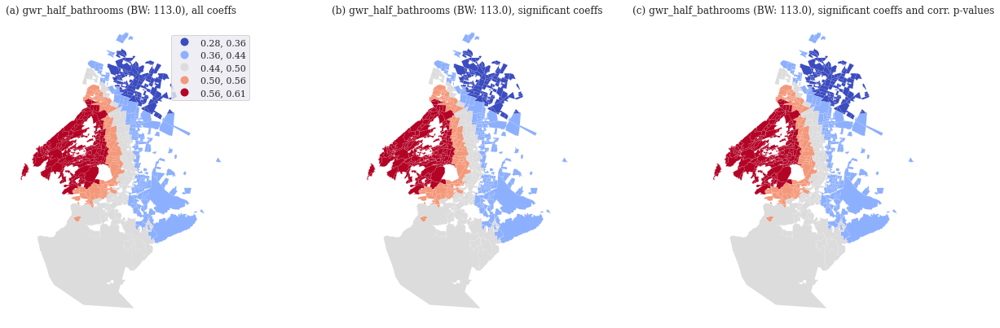

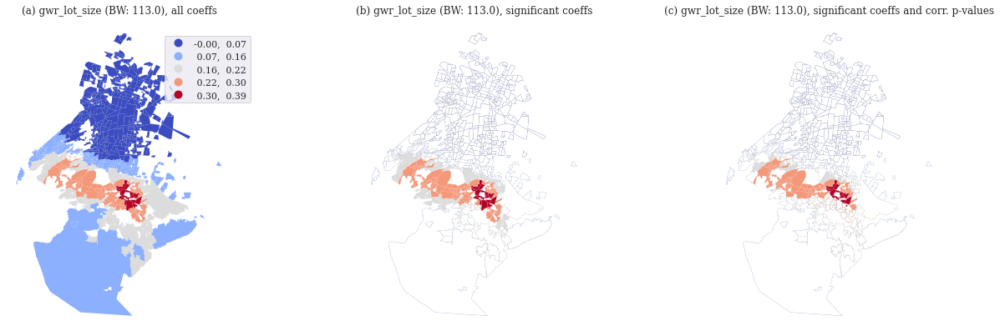

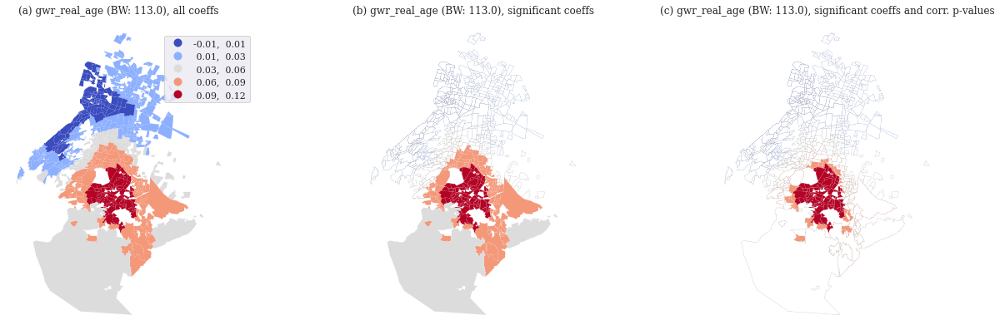

...

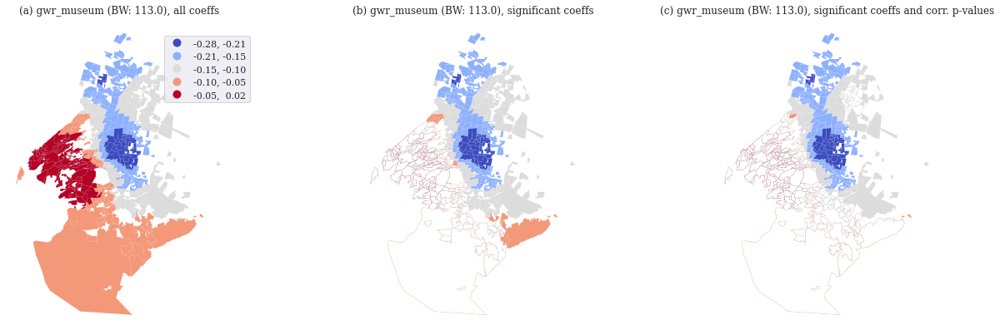

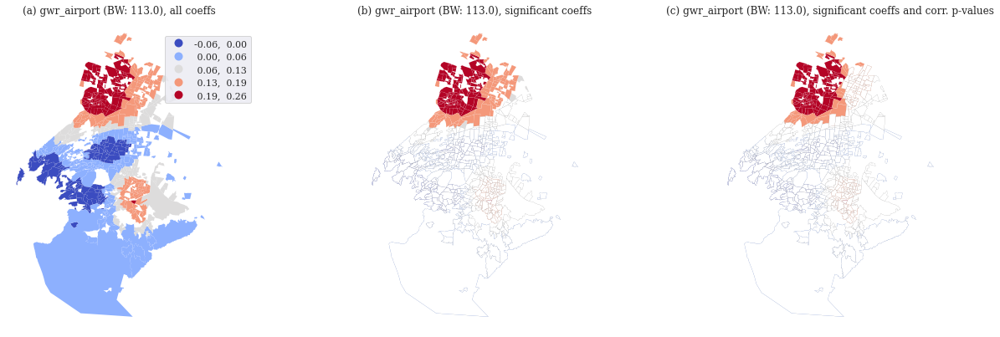

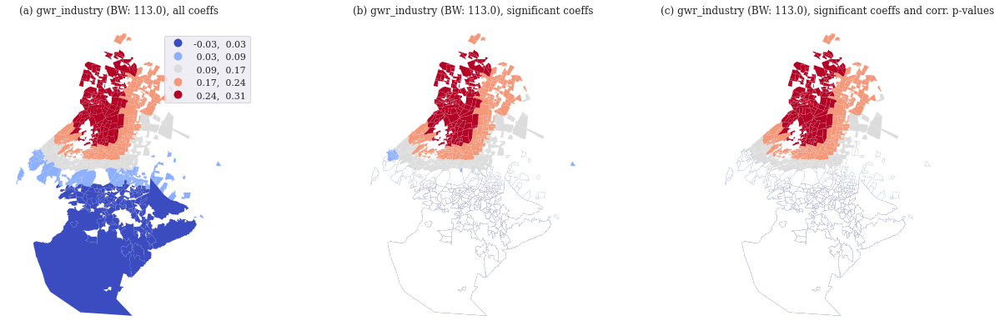

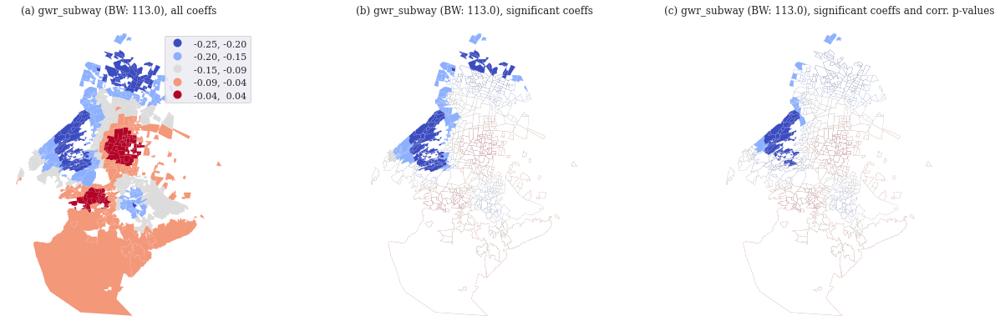

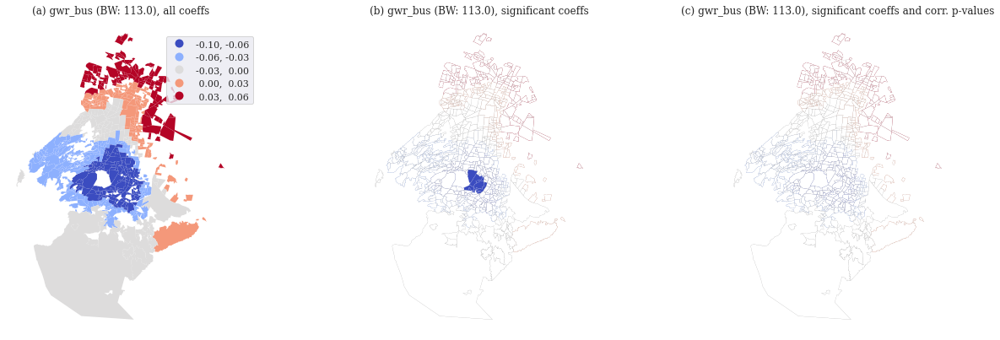

In [21]:
for num,col in enumerate (coef_names):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))

    gdf.plot(column= col, cmap = 'coolwarm', linewidth=0.01, scheme = 'FisherJenks', k=5, legend=True, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[0])

    gdf.plot(column= col, cmap = 'coolwarm', linewidth=0.05, scheme = 'FisherJenks', k=5, legend=False, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[1])
    gdf[gwr_filtered_t[:,num+1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[1])


    gdf.plot(column= col, cmap = 'coolwarm', linewidth=0.05, scheme = 'FisherJenks', k=5, legend=False, legend_kwds={'bbox_to_anchor':(1.10, 0.96)},  ax=axes[2])
    gdf[gwr_filtered_tc[:,num+1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[2])

    plt.tight_layout()

    axes[0].axis("off")
    axes[1].axis("off")
    axes[2].axis("off")

    axes[0].set_title('(a) '+ col +' (BW: ' + str(gwr_bw) +'), all coeffs', fontsize=12)
    axes[1].set_title('(b) '+ col+' (BW: ' + str(gwr_bw) +'), significant coeffs',     fontsize=12)
    axes[2].set_title('(c) '+col +' (BW: ' + str(gwr_bw) +'), significant coeffs and corr. p-values',     fontsize=12)
    plt.show()